## Problem Statement
The electric vehicle (EV) market is rapidly expanding, offering cars with different prices, battery capacities, ranges, charging speeds, and performance levels. However, it is unclear which factors most strongly influence EV pricing and overall performance.

* This project aims to analyze a large dataset of electric cars to understand:

* How battery size, range, efficiency, and charging speed relate to price

* Which brands offer premium vs. budget EVs

Which models provide the best performance and value

The goal is to extract meaningful insights that help compare EV models and understand key factors shaping the electric car market.

## Data Collection

In [156]:
import requests

headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36'
}

url = "https://ev-database.org/#group=vehicle-group&av-1=1&rs-pr=10000_100000&rs-er=0_1000&rs-ld=0_1000&rs-ac=2_23&rs-dcfc=0_400&rs-ub=10_200&rs-tw=0_2500&rs-ef=100_350&rs-sa=-1_5&rs-w=1000_3500&rs-c=0_5000&rs-y=2010_2030&s=1&p=0-10"

data=requests.get(url,headers=headers)
data

<Response [200]>

In [157]:
data_content=data.content
data_content

b'\n<!doctype html>\n\n<html lang="en" data-locale="en-IE" data-region="si">\n\t<!-- head -->\n\t<head>\t\t\n\t<meta charset="utf-8" />\n\t\t\t<link rel="canonical" href="https://ev-database.org/">\t<link rel="alternate" hreflang="en-gb" href="https://ev-database.org/uk/">\t<link rel="alternate" hreflang="de-de" href="https://ev-database.org/de/">\t<link rel="alternate" hreflang="nl-nl" href="https://ev-database.org/nl/">\t<link rel="alternate" hreflang="x-default" href="https://ev-database.org/">\t<meta name="viewport" content="width=device-width, initial-scale=1" />\n\t<title>All electric vehicles in Europe - EV Database</title>\n\t\t<meta name="description" content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price.">\n\n\t<meta property="og:title" content="EV Database" />\n\t<meta property="og:description" content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." />\

In [158]:
from bs4 import BeautifulSoup

In [159]:
new_data=BeautifulSoup(data_content)
new_data.text

"\n\n\n\n     \nAll electric vehicles in Europe - EV Database\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n \n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nAll vehicles \n\n\n\n\n\n\nSettings\n×\n\n\nUNITS\n\n\n                Metric \n\n                Imperial            \n\nSelect the units to use for the European Overview.\n\n\nCancel\nApply\n\n\n\n\n\nSelect Country\n×\n\n\n\n\n European Overview \n\n The Netherlands \n\n United Kingdom \n\n Germany \n\n\n\nCancel\nApply\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nAll electric vehicles\n\n\n\t\t\t\tNo Filters\t\t\t\n\n(Modified):\nSave -\n\t\t\t\tReset\n\n\n\n\n\n\nAll vehicles\n\n\nNo Filters\n\n                        All vehicles                    \n\nYour Filters\n\n                    Your saved filter                \n\nPreset Filters\n\n                            Most recently added                        \n\n                            Most affordable                        \n\n                        

## Data Extraction using Regex

In [160]:
car=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("a",class_="title")
    if r:
        car.append(r.text)
    else:
        car.append(np.nan)
    

In [161]:
car

['Tesla Model Y Long Range AWD (Juniper)Tesla Model Y Long Range AWD',
 'Tesla Model Y RWD (Juniper)Tesla Model Y RWD',
 'MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh',
 'BMW iX xDrive40BMW iX xDrive40',
 'BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive',
 'Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+',
 'Fiat 500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh',
 'CUPRA Born 150 kW - 58 kWhCUPRA Born 150 kW - 58 kWh',
 'Tesla Model 3 Long Range RWD (Highland)Tesla Model 3 Long Range RWD',
 'Tesla Model 3 RWD (Highland CATL LFP64)Tesla Model 3 RWD',
 'Kia EV3 Long RangeKia EV3 Long Range',
 'CUPRA Born 170 kW - 77 kWhCUPRA Born 170 kW - 77 kWh',
 'Tesla Model 3 Long Range RWD (Highland)Tesla Model 3 Long Range RWD',
 'Tesla Model Y Long Range RWD (Juniper)Tesla Model Y Long Range RWD',
 'Renault Twingo E-Tech 27.5 kWhRenault Twingo E-Tech 27.5 kWh',
 'Tesla Model Y Long Range AWDTesla Model Y Long Range AWD',
 'Tesla Model 3 Standard Range PlusTesla Model 3 Standard Range Plus',
 'BYD ATTO 3 (MY

In [162]:
import re

In [163]:
import numpy as np

In [164]:
brand_pattern = r"^(Tesla|MG|BMW|Mercedes\-Benz|Volkswagen|Hyundai|Kia|BYD|Audi|Renault|Peugeot|Skoda|Škoda|Nissan|Volvo|Toyota|Ford|Porsche|Lucid|Polestar|Smart|Fiat|Honda|Mini|Mazda|Jaguar|Opel|Citroen|Citroën|DS|Jeep|Subaru|Suzuki|Genesis|Cadillac|GWM|Leapmotor|Zeekr|Lancia|Hongqi|Voyah|Maserati|Lightyear|Abarth|Lotus|XPENG|Changan|Omoda|Maxus|Alpine|Lynk&Co|TOGG|KGM|Seres|ORA|Elaris|VinFast|Fisker)"
car_name=[]
for i in car:
    regex=re.match(brand_pattern, i.strip())
    if regex:
        car_name.append(regex[0])
    else:
        car_name.append(np.nan)

In [201]:
car_name

['Tesla',
 'Tesla',
 'MG',
 'BMW',
 'BMW',
 'Mercedes-Benz',
 'Fiat',
 nan,
 'Tesla',
 'Tesla',
 'Kia',
 nan,
 'Tesla',
 'Tesla',
 'Renault',
 'Tesla',
 'Tesla',
 'BYD',
 'Tesla',
 'Renault',
 'BYD',
 'Leapmotor',
 'Tesla',
 'BYD',
 'Tesla',
 'Tesla',
 'Volvo',
 'Tesla',
 'Mercedes-Benz',
 'Škoda',
 'Mazda',
 'Hyundai',
 'Tesla',
 'BMW',
 'Fiat',
 'Leapmotor',
 'Audi',
 'BMW',
 'Tesla',
 'Kia',
 'Kia',
 'Hyundai',
 'Tesla',
 'Toyota',
 'BYD',
 'Volkswagen',
 'BYD',
 'Renault',
 'Tesla',
 'Tesla',
 'Mercedes-Benz',
 'Mercedes-Benz',
 'Toyota',
 'Volkswagen',
 'Hyundai',
 'XPENG',
 'BYD',
 'Zeekr',
 'MG',
 'Tesla',
 'Renault',
 'MG',
 'Hyundai',
 'BYD',
 'Zeekr',
 'BMW',
 'Tesla',
 'Škoda',
 'BMW',
 'Mercedes-Benz',
 'Tesla',
 'Kia',
 'BYD',
 'Mercedes-Benz',
 'Ford',
 'Volkswagen',
 'Tesla',
 'BMW',
 'Tesla',
 'BYD',
 'Ford',
 'Hyundai',
 nan,
 'Tesla',
 'Changan',
 'MG',
 nan,
 'Mini',
 'Renault',
 'Kia',
 'Tesla',
 'Omoda',
 'Mercedes-Benz',
 'Tesla',
 'Kia',
 'Citroën',
 'Audi',
 'Lu

In [166]:
range=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="erange_real")
    if r:
        range.append(r.text)
    else:
        range.append(np.nan)
    

In [167]:
len(range)

1149

In [168]:
efficiency=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="efficiency")
    if r:
        efficiency.append(r.text)
    else:
        efficiency.append(np.nan)
    

In [169]:
len(efficiency)

1149

In [170]:
model=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="model")
    if r:
        model.append(r.text)
    else:
        model.append(np.nan)
    

In [171]:
len(model)

1149

In [172]:
model

['Model Y Long Range AWD (Juniper)',
 'Model Y RWD (Juniper)',
 'MG4 Electric 64 kWh',
 'iX xDrive40',
 'iX3 50 xDrive (MY26)',
 'CLA 250+',
 '500e Hatchback 42 kWh',
 'Born 150 kW - 58 kWh',
 'Model 3 Long Range RWD (Highland)',
 'Model 3 RWD (Highland CATL LFP64)',
 'EV3 Long Range',
 'Born 170 kW - 77 kWh',
 'Model 3 Long Range RWD (Highland)',
 'Model Y Long Range RWD (Juniper)',
 'Twingo E-Tech 27.5 kWh',
 'Model Y Long Range AWD',
 'Model 3 Standard Range Plus',
 'ATTO 3 (MY23-24)',
 'Model Y Performance',
 '5 E-Tech 52kWh 150hp',
 'ATTO 2',
 'B10 67.1 kWh',
 'Model 3 Performance (Highland)',
 'SEALION 7 91.3 kWh AWD Excellence',
 'Model Y Long Range RWD',
 'Model Y Standard RWD (Juniper)',
 'EX30 Single Motor ER (MY24-26)',
 'Model Y Performance (Juniper)',
 'GLC 400 4MATIC',
 'Elroq 85 (MY25)',
 '6e 68.8 kWh',
 'Kona Electric 65 kWh',
 'Model 3 Long Range AWD (Highland)',
 'iX1 xDrive30',
 'Grande Panda',
 'T03',
 'e-tron 55 quattro',
 'iX3 (MY22-24)',
 'Model Y Premium AWD (Ju

In [173]:
battery=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="battery_p")
    if r:
        battery.append(r.text)
    else:
        battery.append(np.nan)
    

In [ ]:
battery

In [175]:
fastcharge=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="fastcharge_speed_print")
    if r:
        fastcharge.append(r.text)
    else:
        fastcharge.append(np.nan)
    

In [176]:
len(fastcharge)

1149

In [177]:
Acceleration=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="acceleration_p")
    if r:
        Acceleration.append(r.text)
    else:
        Acceleration.append(np.nan)
    

In [ ]:
Acceleration

In [179]:
Price=[]
for i in new_data.find_all("div",class_="item-data"):
    r=i.find("span",class_="country_uk")
    if r:
        Price.append(r.text)
    else:
        Price.append(np.nan)
    

In [ ]:
Price

In [181]:
Data={'Car_Name':car_name,'Model':model,'Price':Price,'Range':range,'Battery':battery,'Efficiency':efficiency,'Fastcharge':fastcharge,'Acceleration':Acceleration}

## DataFrame Creation

In [182]:
import pandas as pd

In [183]:
cars_df=pd.DataFrame(Data)

In [184]:
cars_df.head(10)

,Car_Name,Model,Price,Range,Battery,Efficiency,Fastcharge,Acceleration
0,Tesla,Model Y Long Range AWD (Juniper),"£51,990",455 km,75.0 kWh,165 Wh/km,124 kW,4.8 sec
1,Tesla,Model Y RWD (Juniper),"£44,990",375 km,60.0 kWh,160 Wh/km,110 kW,5.9 sec
2,MG,MG4 Electric 64 kWh,"£29,495",360 km,61.7 kWh,171 Wh/km,115 kW,7.9 sec
3,BMW,iX xDrive40,"£69,905",360 km,71.0 kWh,197 Wh/km,102 kW,6.1 sec
4,BMW,iX3 50 xDrive (MY26),"£58,755",610 km,108.7 kWh,178 Wh/km,225 kW,4.9 sec
5,Mercedes-Benz,CLA 250+,"£45,615",585 km,85.0 kWh,145 Wh/km,235 kW,6.7 sec
6,Fiat,500e Hatchback 42 kWh,"£27,995",235 km,37.3 kWh,159 Wh/km,67 kW,9.0 sec
7,NaN,Born 150 kW - 58 kWh,"£34,125",350 km,58.0 kWh,166 Wh/km,82 kW,7.3 sec
8,Tesla,Model 3 Long Range RWD (Highland),"£44,990",550 km,75.0 kWh,136 Wh/km,124 kW,5.2 sec
9,Tesla,Model 3 RWD (Highland CATL LFP64),"£39,990",440 km,60.0 kWh,136 Wh/km,110 kW,6.1 sec


In [185]:
cars_df['Price_Clean'] = (
    cars_df['Price']
    .str.replace(r'[^0-9.]', '', regex=True)  
    .replace('', np.nan)                     
)


cars_df['Price_Clean'] = pd.to_numeric(cars_df['Price_Clean'], errors='coerce')

# Step 3: Convert UK → INR 
cars_df['Price_INR'] = cars_df['Price_Clean'] * 105

In [186]:
cars_df['Range_km'] = (
    cars_df['Range']
    .str.extract(r'(\d+\.?\d*)')
    .astype(float)
)

In [187]:

cars_df['Battery_kWh'] = (
    cars_df['Battery']
    .str.extract(r'(\d+\.?\d*)')
    .astype(float)
)

cars_df['Efficiency_Whkm'] = (
    cars_df['Efficiency']
    .str.extract(r'(\d+\.?\d*)')
    .astype(float)
)

cars_df['Fastcharge_kW'] = (
    cars_df['Fastcharge']
    .str.extract(r'(\d+\.?\d*)')
    .astype(float)
)

cars_df['Acceleration_sec(0-100)'] = (
    cars_df['Acceleration']
    .str.extract(r'(\d+\.?\d*)')
    .astype(float)
)


In [188]:
cars_df = cars_df.drop(columns=['Range','Battery','Efficiency','Fastcharge','Acceleration','Price','Price_Clean'])


In [190]:
cars_df['Model'] = cars_df['Model'].str.replace(r'\(.*?\)', '', regex=True).str.strip()

In [191]:
cars_df.head(2)

,Car_Name,Model,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
0,Tesla,Model Y Long Range AWD,5458950.0,455.0,75.0,165.0,124.0,4.8
1,Tesla,Model Y RWD,4723950.0,375.0,60.0,160.0,110.0,5.9


In [192]:
cars_df.shape

(1149, 8)

## Export to csv

In [193]:
cars_df.to_csv("Electric.csv",index=False)

## Importing csv file

In [3]:
import numpy as np
import pandas as pd

In [4]:
df=pd.read_csv("Electric_cars.csv")

In [5]:
df.head()

,Car_Name,Model,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
0,Tesla,Model Y Long Range AWD,5458950.0,455.0,75.0,165.0,124.0,4.8
1,Tesla,Model Y RWD,4723950.0,375.0,60.0,160.0,110.0,5.9
2,MG,MG4 Electric 64 kWh,3096975.0,360.0,61.7,171.0,115.0,7.9
3,BMW,iX xDrive40,7340025.0,360.0,71.0,197.0,102.0,6.1
4,BMW,iX3 50 xDrive,6169275.0,610.0,108.7,178.0,225.0,4.9


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Car_Name                 1093 non-null   object 
 1   Model                    1149 non-null   object 
 2   Price_INR                833 non-null    float64
 3   Range_km                 1149 non-null   float64
 4   Battery_kWh              1149 non-null   float64
 5   Efficiency_Whkm          1149 non-null   float64
 6   Fastcharge_kW            1149 non-null   float64
 7   Acceleration_sec(0-100)  1149 non-null   float64
dtypes: float64(6), object(2)
memory usage: 71.9+ KB


In [7]:
df.describe()

,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
count,8.330000e+02,1149.000000,1149.000000,1149.000000,1149.000000,1149.000000
mean,6.015483e+06,374.490862,70.937337,191.150566,113.963446,7.232028
std,3.394289e+06,113.417099,21.587310,29.565273,55.456755,3.060132
min,1.521975e+06,85.000000,14.500000,109.000000,0.000000,2.000000
25%,3.683925e+06,295.000000,56.000000,170.000000,78.000000,4.900000
50%,5.207475e+06,385.000000,74.000000,184.000000,110.000000,6.700000
75%,7.242375e+06,455.000000,86.500000,205.000000,140.000000,8.800000
max,3.465000e+07,720.000000,123.000000,295.000000,330.000000,22.400000


## Data Cleaning

In [8]:
df.isnull().sum()

Car_Name                    56
Model                        0
Price_INR                  316
Range_km                     0
Battery_kWh                  0
Efficiency_Whkm              0
Fastcharge_kW                0
Acceleration_sec(0-100)      0
dtype: int64

In [9]:
df = df[df['Car_Name'].notna()]

In [10]:
df = df[df['Price_INR'].notna()]

In [11]:
df.isnull().sum()

Car_Name                   0
Model                      0
Price_INR                  0
Range_km                   0
Battery_kWh                0
Efficiency_Whkm            0
Fastcharge_kW              0
Acceleration_sec(0-100)    0
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 804 entries, 0 to 1142
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Car_Name                 804 non-null    object 
 1   Model                    804 non-null    object 
 2   Price_INR                804 non-null    float64
 3   Range_km                 804 non-null    float64
 4   Battery_kWh              804 non-null    float64
 5   Efficiency_Whkm          804 non-null    float64
 6   Fastcharge_kW            804 non-null    float64
 7   Acceleration_sec(0-100)  804 non-null    float64
dtypes: float64(6), object(2)
memory usage: 56.5+ KB


In [13]:
df.describe()

,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
count,8.040000e+02,804.000000,804.000000,804.000000,804.000000,804.000000
mean,6.049203e+06,377.568408,70.812189,188.024876,117.266169,6.989179
std,3.273412e+06,108.702132,21.606467,26.770355,57.048417,2.786732
min,1.521975e+06,85.000000,14.500000,109.000000,0.000000,2.200000
25%,3.726975e+06,310.000000,53.250000,169.000000,78.000000,4.800000
50%,5.248950e+06,390.000000,75.000000,182.000000,110.000000,6.700000
75%,7.332019e+06,455.000000,86.500000,202.000000,141.000000,8.500000
max,2.782500e+07,685.000000,118.000000,295.000000,281.000000,22.400000


In [14]:
df.columns

Index(['Car_Name', 'Model', 'Price_INR', 'Range_km', 'Battery_kWh',
       'Efficiency_Whkm', 'Fastcharge_kW', 'Acceleration_sec(0-100)'],
      dtype='object')

In [15]:
df.shape

(804, 8)

In [16]:
df.duplicated().sum()

np.int64(4)

In [17]:
df[df.duplicated()]

,Car_Name,Model,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
547,Mercedes-Benz,EQA 300 4MATIC,5566050.0,350.0,66.5,190.0,100.0,7.7
785,Mercedes-Benz,EQA 350 4MATIC,5723550.0,350.0,66.5,190.0,100.0,6.0
821,Mercedes-Benz,EQA 250+,5223750.0,420.0,70.5,168.0,90.0,8.6
938,Polestar,2 Long Range Performance,6084750.0,450.0,79.0,176.0,125.0,4.2


In [18]:
df.drop_duplicates()

,Car_Name,Model,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
0,Tesla,Model Y Long Range AWD,5458950.0,455.0,75.0,165.0,124.0,4.8
1,Tesla,Model Y RWD,4723950.0,375.0,60.0,160.0,110.0,5.9
2,MG,MG4 Electric 64 kWh,3096975.0,360.0,61.7,171.0,115.0,7.9
3,BMW,iX xDrive40,7340025.0,360.0,71.0,197.0,102.0,6.1
4,BMW,iX3 50 xDrive,6169275.0,610.0,108.7,178.0,225.0,4.9
...,...,...,...,...,...,...,...,...
1131,Smart,ForTwo Cabrio Electric Drive,1948800.0,95.0,16.7,176.0,0.0,11.8
1132,Porsche,Taycan 4S Plus Sport Turismo,10079580.0,430.0,83.7,195.0,216.0,4.0
1133,Porsche,Taycan Turbo Sport Turismo,13314000.0,405.0,83.7,207.0,216.0,3.2
1136,Citroën,ë-SpaceTourer XL 50 kWh,3977925.0,180.0,46.3,257.0,78.0,12.1


### Outliers

In [27]:
import numpy as np
import seaborn as sns
numeric_cols = ['Price_INR', 'Range_km', 'Battery_kWh', 
                'Efficiency_Whkm', 'Fastcharge_kW', 'Acceleration_sec(0-100)']

outlier_summary = {}

for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)]

    outlier_summary[col] = len(outliers)

outlier_summary


{'Price_INR': 37,
 'Range_km': 5,
 'Battery_kWh': 0,
 'Efficiency_Whkm': 34,
 'Fastcharge_kW': 34,
 'Acceleration_sec(0-100)': 12}

## Data Analysis and Visualization (EDA)

### Numerical Data

In [20]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
numerical_cols

Index(['Price_INR', 'Range_km', 'Battery_kWh', 'Efficiency_Whkm',
       'Fastcharge_kW', 'Acceleration_sec(0-100)'],
      dtype='object')

### Categorical Data

In [21]:
categorical_cols = df.select_dtypes(include=['object']).columns
categorical_cols

Index(['Car_Name', 'Model'], dtype='object')

### Univariate Analysis

#### Summary Statistics

In [22]:
df.describe()

,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
count,8.040000e+02,804.000000,804.000000,804.000000,804.000000,804.000000
mean,6.049203e+06,377.568408,70.812189,188.024876,117.266169,6.989179
std,3.273412e+06,108.702132,21.606467,26.770355,57.048417,2.786732
min,1.521975e+06,85.000000,14.500000,109.000000,0.000000,2.200000
25%,3.726975e+06,310.000000,53.250000,169.000000,78.000000,4.800000
50%,5.248950e+06,390.000000,75.000000,182.000000,110.000000,6.700000
75%,7.332019e+06,455.000000,86.500000,202.000000,141.000000,8.500000
max,2.782500e+07,685.000000,118.000000,295.000000,281.000000,22.400000


### Distribution plots

#### Histogram + KDE – PRICE

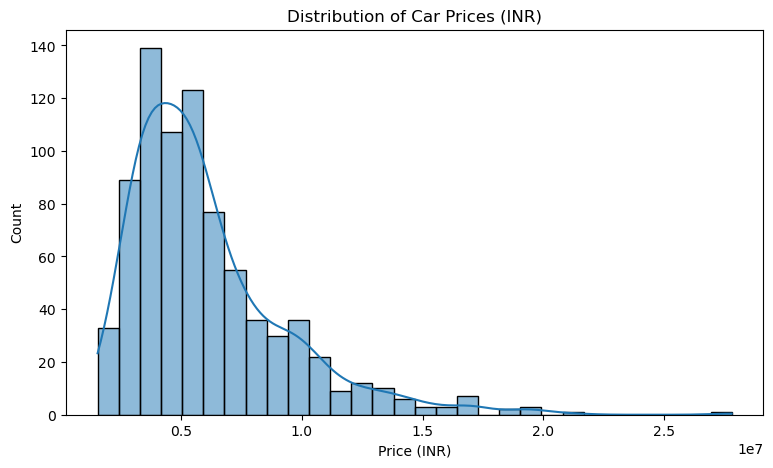

In [28]:
plt.figure(figsize=(9,5))
sns.histplot(df['Price_INR'], kde=True, bins=30)
plt.title("Distribution of Car Prices (INR)")
plt.xlabel("Price (INR)")
plt.ylabel("Count")
plt.show()


#### Histogram + KDE – RANGE

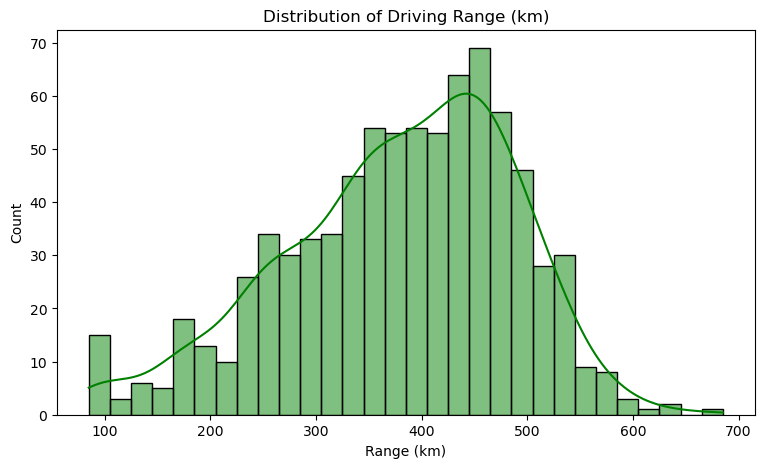

In [29]:
plt.figure(figsize=(9,5))
sns.histplot(df['Range_km'], kde=True, bins=30, color="green")
plt.title("Distribution of Driving Range (km)")
plt.xlabel("Range (km)")
plt.ylabel("Count")
plt.show()


#### Histogram + KDE – BATTERY

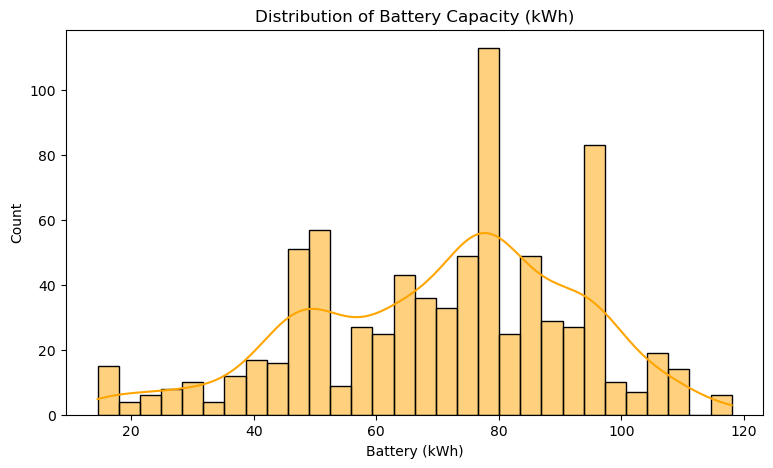

In [30]:
plt.figure(figsize=(9,5))
sns.histplot(df['Battery_kWh'], kde=True, bins=30, color="orange")
plt.title("Distribution of Battery Capacity (kWh)")
plt.xlabel("Battery (kWh)")
plt.ylabel("Count")
plt.show()


#### Countplot – CAR BRAND POPULARITY

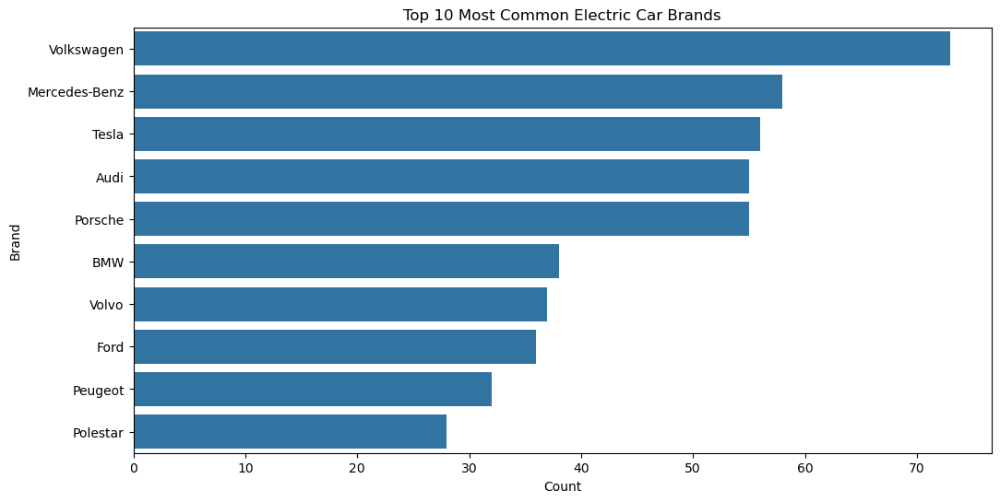

In [31]:
plt.figure(figsize=(12,6))
top10 = df['Car_Name'].value_counts().head(10)

sns.barplot(x=top10.values, y=top10.index)
plt.title("Top 10 Most Common Electric Car Brands")
plt.xlabel("Count")
plt.ylabel("Brand")
plt.show()


#### Boxplot – DETECT PRICE OUTLIERS

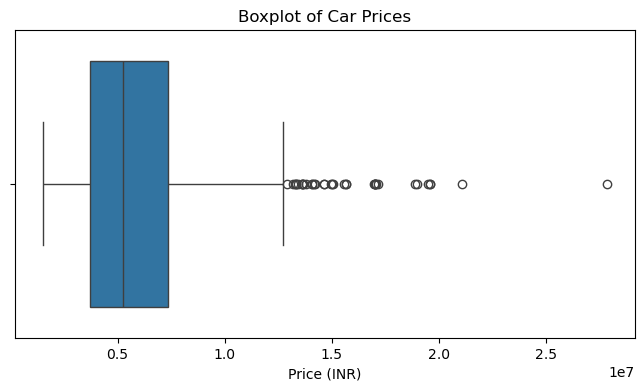

In [32]:
plt.figure(figsize=(8,4))
sns.boxplot(x=df['Price_INR'])
plt.title("Boxplot of Car Prices")
plt.xlabel("Price (INR)")
plt.show()


#### Brand distribution (categorical)

<Axes: xlabel='Car_Name'>

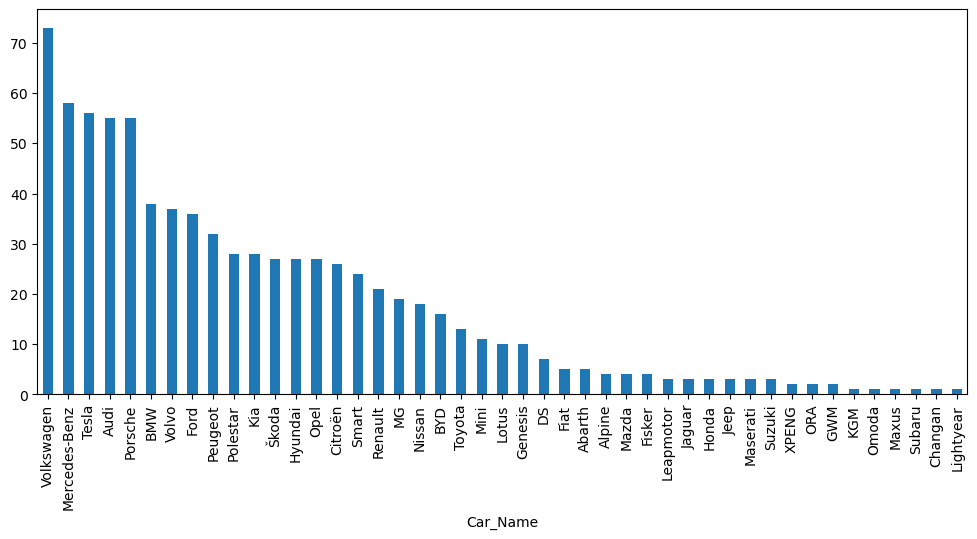

In [33]:
df['Car_Name'].value_counts().plot(kind='bar', figsize=(12,5))

# A few brands (like Tesla, MG, BMW, BYD) have many models, while others appear only once or twice.

### BIVARIATE ANALYSIS

#### Scatter Plot – PRICE vs RANGE

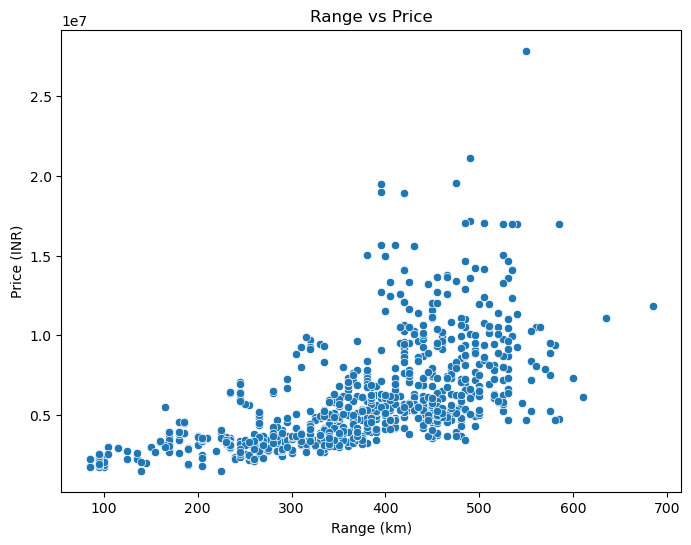

In [34]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='Range_km', y='Price_INR', data=df)
plt.title("Range vs Price")
plt.xlabel("Range (km)")
plt.ylabel("Price (INR)")
plt.show()


#### Scatter Plot – PRICE vs BATTERY

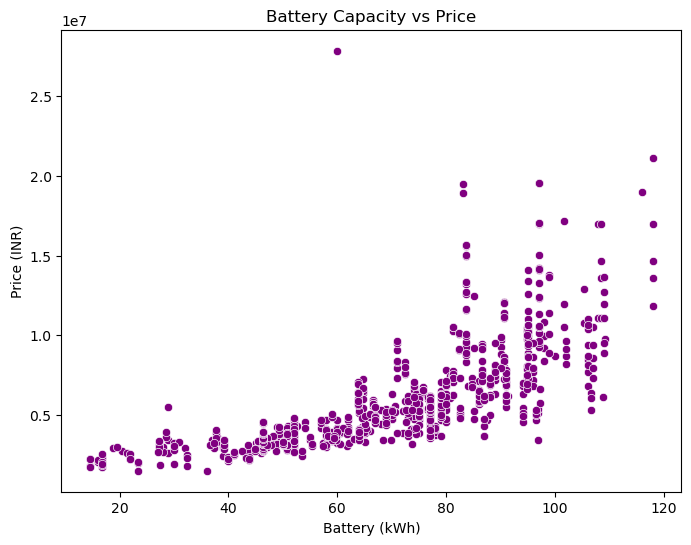

In [35]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='Battery_kWh', y='Price_INR', data=df, color="purple")
plt.title("Battery Capacity vs Price")
plt.xlabel("Battery (kWh)")
plt.ylabel("Price (INR)")
plt.show()


#### Boxplot – BRAND vs PRICE

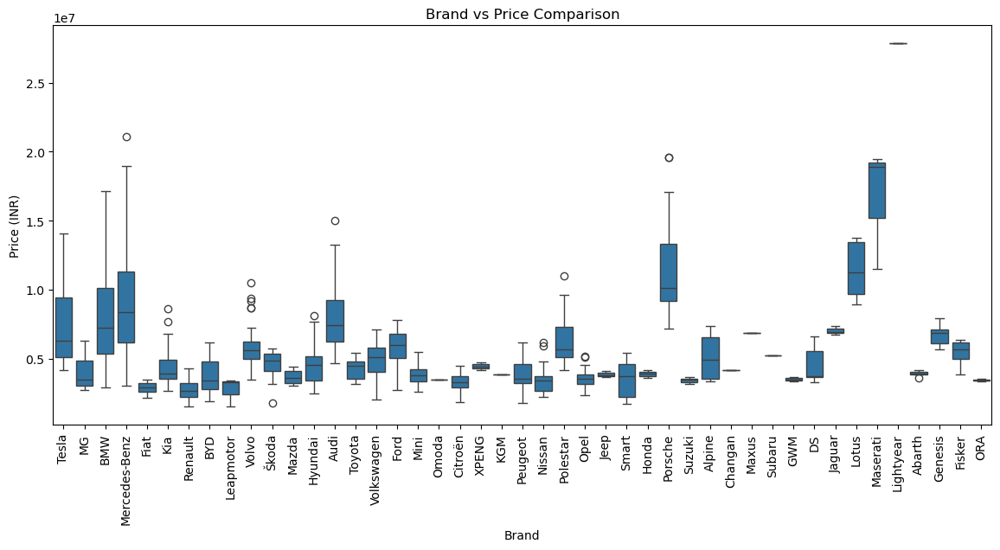

In [36]:
plt.figure(figsize=(14,6))
sns.boxplot(x='Car_Name', y='Price_INR', data=df)
plt.title("Brand vs Price Comparison")
plt.xticks(rotation=90)
plt.ylabel("Price (INR)")
plt.xlabel("Brand")
plt.show()


#### Lineplot – EFFICIENCY vs RANGE

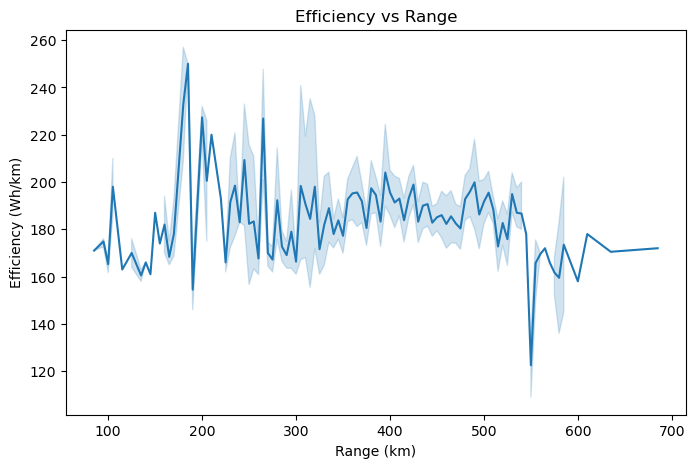

In [37]:
plt.figure(figsize=(8,5))
sns.lineplot(x='Range_km', y='Efficiency_Whkm', data=df)
plt.title("Efficiency vs Range")
plt.xlabel("Range (km)")
plt.ylabel("Efficiency (Wh/km)")
plt.show()


### MULTIVARIATE ANALYSIS

#### Correlation Heatmap

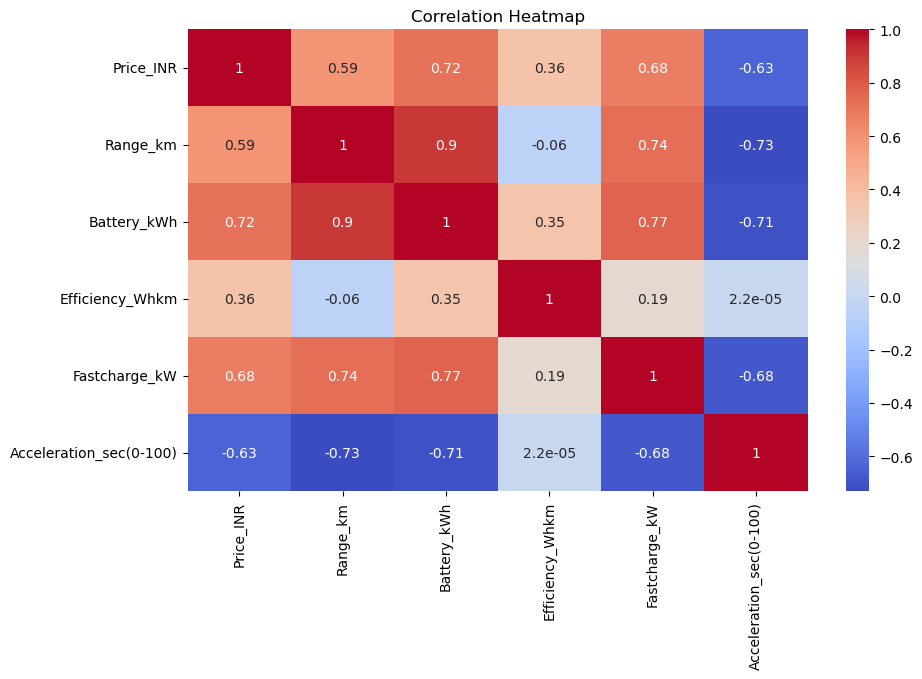

In [38]:
plt.figure(figsize=(10,6))
sns.heatmap(df[['Price_INR','Range_km','Battery_kWh','Efficiency_Whkm','Fastcharge_kW','Acceleration_sec(0-100)']].corr(),
            annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


#### Pairplot – FULL MULTIVARIATE RELATION

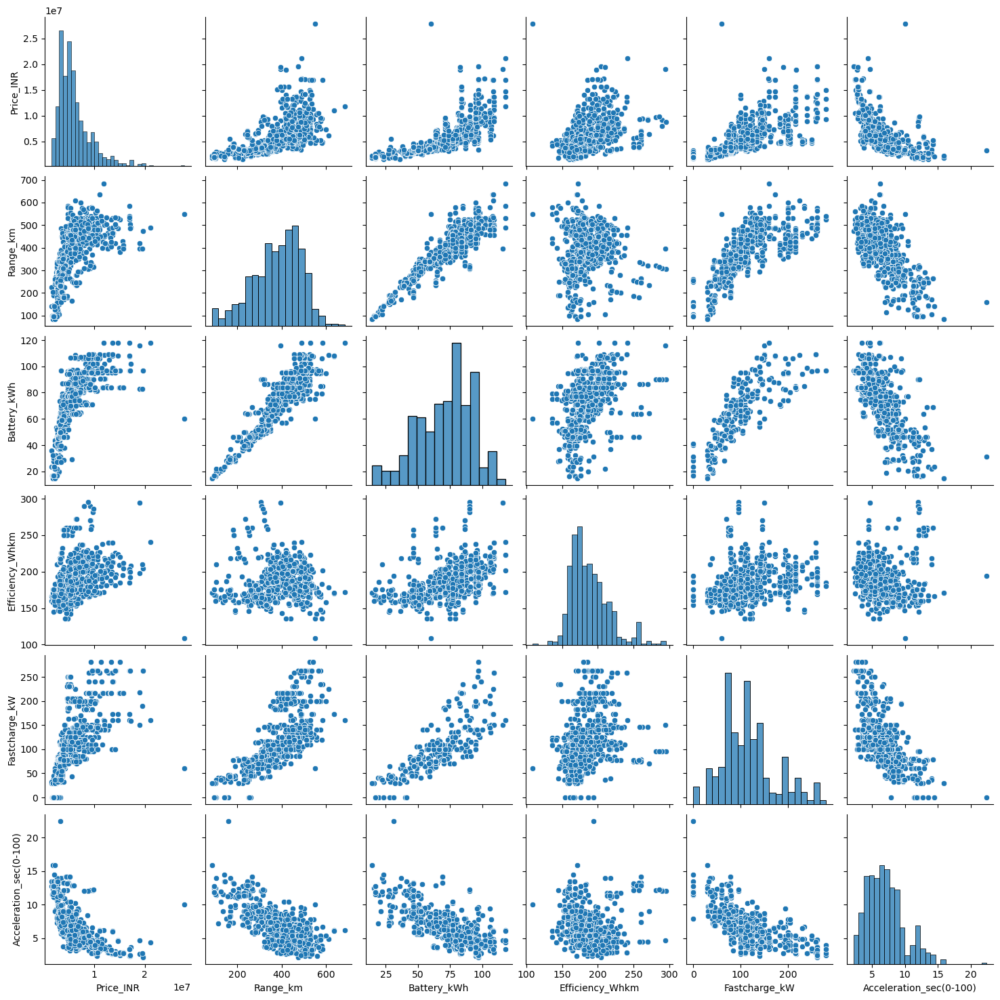

In [39]:
sns.pairplot(df[['Price_INR','Range_km','Battery_kWh','Efficiency_Whkm','Fastcharge_kW','Acceleration_sec(0-100)']])
plt.show()


#### Barplot – AVG PRICE BY BRAND

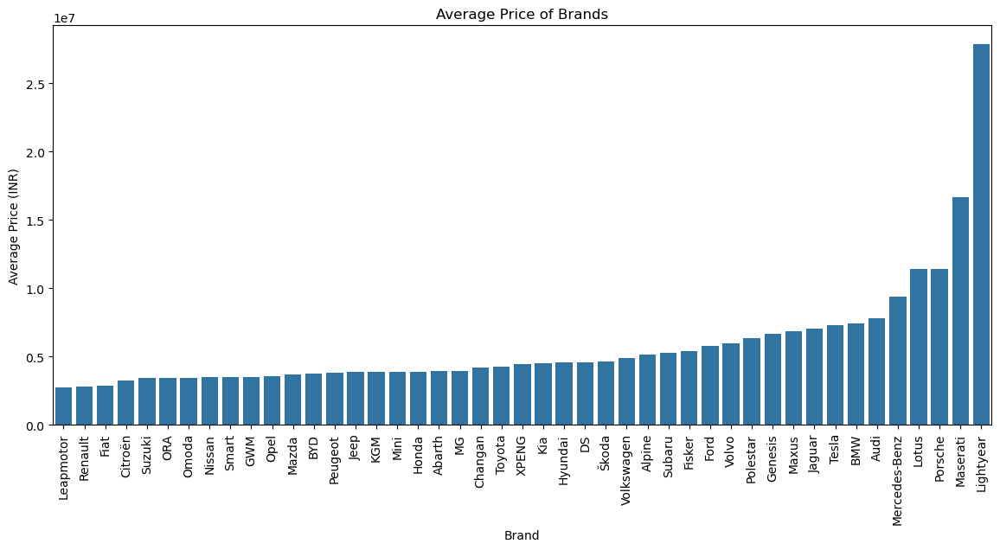

In [40]:
plt.figure(figsize=(14,6))
avg_brand = df.groupby('Car_Name')['Price_INR'].mean().sort_values()
sns.barplot(x=avg_brand.index, y=avg_brand.values)
plt.xticks(rotation=90)
plt.title("Average Price of Brands")
plt.xlabel("Brand")
plt.ylabel("Average Price (INR)")
plt.show()


### EDA Insights

#### Number of cars per brand

In [230]:
df['Car_Name'].value_counts()

Car_Name
Volkswagen       73
Mercedes-Benz    58
Tesla            56
Audi             55
Porsche          55
BMW              38
Volvo            37
Ford             36
Peugeot          32
Polestar         28
Kia              28
Škoda            27
Hyundai          27
Opel             27
Citroën          26
Smart            24
Renault          21
MG               19
Nissan           18
BYD              16
Toyota           13
Mini             11
Lotus            10
Genesis          10
DS                7
Fiat              5
Abarth            5
Alpine            4
Mazda             4
Fisker            4
Leapmotor         3
Jaguar            3
Honda             3
Jeep              3
Maserati          3
Suzuki            3
XPENG             2
ORA               2
GWM               2
KGM               1
Omoda             1
Maxus             1
Subaru            1
Changan           1
Lightyear         1
Name: count, dtype: int64

#### Top Cheapest Cars

In [231]:
df.nsmallest(10, 'Price_INR')[['Car_Name','Model','Price_INR']]


,Car_Name,Model,Price_INR
35,Leapmotor,T03,1521975.0
464,Renault,Zoe Q210,1521975.0
529,Smart,ForTwo Electric Drive,1724100.0
900,Smart,ForFour Electric Drive,1776075.0
763,Peugeot,iOn,1784475.0
515,Škoda,CITIGOe iV,1832775.0
677,Citroën,C-Zero,1839600.0
710,Smart,EQ fortwo coupe,1857975.0
14,Renault,Twingo E-Tech 27.5 kWh,1890000.0
974,Smart,EQ forfour,1909950.0


#### Top Expensive Cars

In [232]:
df.nlargest(10, 'Price_INR')[['Car_Name','Model','Price_INR']]

,Car_Name,Model,Price_INR
484,Lightyear,0,27825000.0
425,Mercedes-Benz,EQS SUV Maybach 680,21090300.0
646,Porsche,Taycan Turbo GT,19561500.0
745,Porsche,Taycan Turbo GT Weissach,19561500.0
883,Maserati,GranCabrio Folgore,19489050.0
131,Mercedes-Benz,G 580,18990300.0
452,Maserati,GranTurismo Folgore,18894750.0
471,BMW,i7 M70 xDrive,17148075.0
1080,Porsche,Taycan Turbo S Cross Turismo,17062500.0
994,Porsche,Taycan Turbo S Sport Turismo,17020500.0


#### Highest Range Cars

In [233]:
df.nlargest(10, 'Range_km')[['Car_Name','Model','Range_km']]

,Car_Name,Model,Range_km
50,Mercedes-Benz,EQS 450+,685.0
340,Mercedes-Benz,EQS 450+,635.0
593,Mercedes-Benz,EQS 450+,635.0
4,BMW,iX3 50 xDrive,610.0
158,Audi,A6 Sportback e-tron performance,600.0
5,Mercedes-Benz,CLA 250+,585.0
461,Mercedes-Benz,EQS AMG 53 4MATIC+,585.0
12,Tesla,Model 3 Long Range RWD,580.0
127,Polestar,5 Dual Motor,580.0
73,Mercedes-Benz,CLA 350 4MATIC,575.0


#### Lowest Range Cars

In [234]:
df.nsmallest(10, 'Range_km')[['Car_Name','Model','Range_km']]

,Car_Name,Model,Range_km
640,Peugeot,iOn,85.0
677,Citroën,C-Zero,85.0
763,Peugeot,iOn,85.0
848,Citroën,C-Zero,85.0
468,Smart,EQ forfour,95.0
765,Volkswagen,e-Up!,95.0
900,Smart,ForFour Electric Drive,95.0
952,Smart,EQ fortwo cabrio,95.0
974,Smart,EQ forfour,95.0
1011,Smart,EQ fortwo cabrio,95.0


#### Battery Capacity Analysis

In [236]:
df[['Battery_kWh']].describe().T

,count,mean,std,min,25%,50%,75%,max
Battery_kWh,804.0,70.812189,21.606467,14.5,53.25,75.0,86.5,118.0


#### Efficiency (Wh/km) Analysis

In [237]:
df[['Efficiency_Whkm']].describe().T

,count,mean,std,min,25%,50%,75%,max
Efficiency_Whkm,804.0,188.024876,26.770355,109.0,169.0,182.0,202.0,295.0


#### Fastcharge Power Analysis

In [238]:
df[['Fastcharge_kW']].describe().T

,count,mean,std,min,25%,50%,75%,max
Fastcharge_kW,804.0,117.266169,57.048417,0.0,78.0,110.0,141.0,281.0


#### Acceleration (0–100 km/h)

In [240]:
df[['Acceleration_sec(0-100)']].describe().T

,count,mean,std,min,25%,50%,75%,max
Acceleration_sec(0-100),804.0,6.989179,2.786732,2.2,4.8,6.7,8.5,22.4


#### Correlation Matrix

In [242]:
df.corr(numeric_only=True)

,Price_INR,Range_km,Battery_kWh,Efficiency_Whkm,Fastcharge_kW,Acceleration_sec(0-100)
Price_INR,1.000000,0.590004,0.719963,0.362346,0.678747,-0.631448
Range_km,0.590004,1.000000,0.902514,-0.060365,0.735407,-0.731699
Battery_kWh,0.719963,0.902514,1.000000,0.354181,0.771031,-0.710244
Efficiency_Whkm,0.362346,-0.060365,0.354181,1.000000,0.188482,0.000022
Fastcharge_kW,0.678747,0.735407,0.771031,0.188482,1.000000,-0.679720
Acceleration_sec(0-100),-0.631448,-0.731699,-0.710244,0.000022,-0.679720,1.000000


## Conclusion

This project analyzed 804 electric car models, focusing on pricing, battery capacity, range, efficiency, fast-charging capability, and performance. After data cleaning and null-handling, several important patterns were discovered:

* Price strongly depends on battery size and driving range — larger battery cars cost significantly more.

* Tesla, BMW, Mercedes, Audi form the premium price cluster, while MG, Renault, Fiat, Dacia belong to the budget segment.

* Cars with higher battery capacity generally deliver better range, suggesting strong engineering consistency across brands.

* Fast-charging capacity is higher in premium EVs, meaning a better charging experience.

* Cars with low acceleration times (high performance) also tend to have the highest prices.

* Efficiency (Wh/km) varies a lot, showing that some brands are more optimized for energy consumption.

* Identified a few outliers in price and efficiency, which were handled to improve analysis quality.

Overall, the project provides a complete overview of the EV market, helping understand which factors influence EV pricing and performance the most. This analysis can support buyers, manufacturers, and EV researchers in making data-driven decisions.